In [3]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt

from PIL import Image

In [2]:
torch.cuda.is_available()

False

In [2]:
# Загрузка и предобработка данных
transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(), 
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

classes = train_dataset.classes

In [3]:
# test new transforms Resnet34 v2
# used in best result

transform = transforms.Compose([transforms.Resize((300, 300)),
                                transforms.CenterCrop((100, 100)),
                                transforms.RandomCrop((80, 80)),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomRotation(degrees=(-90, 90)),
                                transforms.RandomVerticalFlip(p=0.5),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

classes = train_dataset.classes

In [6]:
sample_image = Image.open('./images_crops/test/cabbage/4.jpg')

In [10]:
transform_custom = transforms.Compose([transforms.Resize((300, 300)),
                                transforms.CenterCrop((100, 100))])

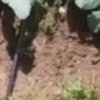

In [11]:
transform_custom(sample_image)

In [23]:
# test new transforms Resnet34 v3
transform = transforms.Compose([transforms.Resize((300, 300)),
                                transforms.CenterCrop((100, 100)),
                                transforms.RandomGrayscale(p=0.1),
                                transforms.RandomCrop((80, 80)),
                                transforms.RandomHorizontalFlip(p=0.5),
                                transforms.RandomRotation(degrees=(0, 20)),
                                transforms.RandomVerticalFlip(p=0.5),
                                transforms.ToTensor(),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

classes = train_dataset.classes

In [14]:
# Script 
from PIL import Image
import torch
import torchvision
from torchvision import transforms, datasets
from torch.nn.functional import softmax
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def test(path_image: str):
    '''
    Функция принимает на вход путь к изображению, разрезает его,
    каждый фрагмент отправляет в модель.
    Выходное значение - список тензоров с вероятноястями.
    '''
               
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu") 
    image = Image.open(path_image)
    width, height = image.size
    
    transform = transforms.Compose([transforms.Resize((224, 224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                         std=[0.229, 0.224, 0.225])])
    
    train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
    classes = train_dataset.classes
    
    # Список из списков с тензорами вероятностей классов
    predicted_output = [[] for lst in range(0, 19)]
    
    # Настройки для отрисовывания
    colors = ['red', 'blue', 'yellow', 'green', 'orange', 'brown', 'white', 'black']
    
    classes_colors = dict(zip(range(0, 100), zip(classes, colors)))
    
    draw = ImageDraw.Draw(image)
    
    upper = 0
    lower = round(height * 0.1)
    
    row = -1
    
    for h in range(0, 19):
        row += 1
        left = 0
        right = round(width * 0.1)
        
        for w in range(0, 19):
            cropped_image = image.crop((left, upper, right, lower))
            transfromed_image = transform(cropped_image).unsqueeze(0).to(device)
                           
            draw.line((left, upper, right, upper), fill='black', width=10)
            draw.line((right, upper, right, lower), fill='black', width=10)
            draw.line((left, lower, right, lower), fill='black', width=10)
            draw.line((left, lower, left, upper), fill='black', width=10)
            
            left += round(width * 0.1)
            right += round(width * 0.1)
            
        upper += round(height * 0.1)
        lower += round(height * 0.1)
    
    
    plt.figure(figsize=(16, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    
    return 1

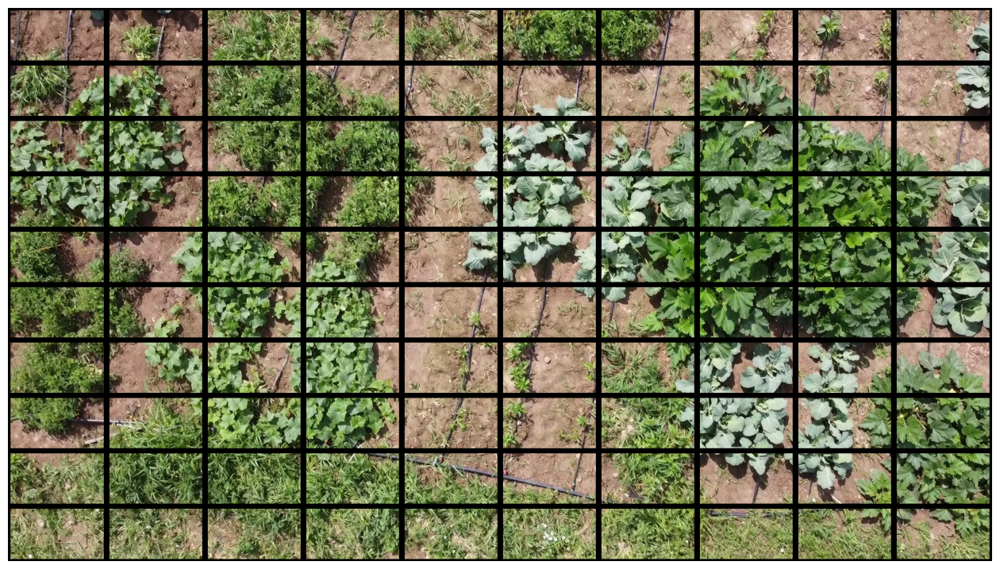

1

In [15]:
test('./test_multiple/frame6059.jpg')

In [33]:
# Создание модели
model = torchvision.models.resnet18(weights='IMAGENET1K_V1')
num_classes = len(classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [34]:
# Определение функции потерь и оптимизатора
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
#optimizer = optim.Adam(model.parameters(), lr=0.001)

In [35]:
# Обучение модели
num_epochs = 20
for epoch in range(num_epochs):
    for images, labels in train_dataloader:
        images = images.to(device)
        labels = labels.to(device)
        
        optimizer.zero_grad()
        
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {loss.item()}')

Epoch [1/20], Loss: 0.7321605682373047
Epoch [2/20], Loss: 1.3938653469085693
Epoch [3/20], Loss: 1.0802901983261108
Epoch [4/20], Loss: 0.6190246343612671
Epoch [5/20], Loss: 0.35223329067230225
Epoch [6/20], Loss: 0.45135682821273804
Epoch [7/20], Loss: 0.23909230530261993
Epoch [8/20], Loss: 0.8788993954658508
Epoch [9/20], Loss: 0.2904368042945862
Epoch [10/20], Loss: 0.028613975271582603
Epoch [11/20], Loss: 1.0696048736572266
Epoch [12/20], Loss: 0.3874892294406891
Epoch [13/20], Loss: 0.2009199857711792
Epoch [14/20], Loss: 1.2169109582901
Epoch [15/20], Loss: 0.4277704656124115
Epoch [16/20], Loss: 0.10800045728683472
Epoch [17/20], Loss: 0.06775966286659241
Epoch [18/20], Loss: 0.151292085647583
Epoch [19/20], Loss: 0.04270029067993164
Epoch [20/20], Loss: 0.07409282773733139


import torch
torch.save(model, './saved_models/nn_ver9_18.pt')

In [38]:
import torch
# nn_ver12_18 - Adam хорошо для кукурузы
#nn_ver9_18 - SGD - хорошо для капусты

model = torch.load('./saved_models/nn_ver12_18.pt', map_location=torch.device('cpu'))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
from numpy import mean

transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(), 
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

sample_image = Image.open('./images_crops/test/cabbage/4.jpg')
sample_image_tensor = transform(sample_image).unsqueeze(0).to(device)
model_adam = torch.load('./saved_models/nn_ver12_18.pt', map_location=torch.device('cpu'))

_, predicted_index_adam = torch.max(output_adam.data, 1)
model_adam.eval()
output_adam = model_adam(sample_image_tensor)
prob_adam = torch.nn.functional.softmax(output_adam, dim=1)

In [27]:
lst = [1, 2, 3]
lst.index(max(lst))

2

In [ ]:
# test ensemble
model_sgd = torch.load('./saved_models/nn_ver9_18.pt', map_location=torch.device('cpu'))
model_adam = torch.load('./saved_models/nn_ver12_18.pt', map_location=torch.device('cpu'))

from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
from numpy import mean

transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(), 
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

classes = train_dataset.classes

# Визуализация предсказаний
sample_image = Image.open('./images_crops/test/cabbage/4.jpg')
sample_image_tensor = transform(sample_image).unsqueeze(0).to(device)

with torch.no_grad():
    model_sgd.eval()
    model_adam.eval()
    
    output_sgd = model_sgd(sample_image_tensor)
    output_adam = model_adam(sample_image_tensor)
    
    _, predicted_index_sgd = torch.max(output_sgd.data, 1)
    _, predicted_index_adam = torch.max(output_adam.data, 1)
    
    prob_sgd = torch.nn.functional.softmax(output_sgd, dim=1)
    prob_adam = torch.nn.functional.softmax(output_adam, dim=1)
    
    predicted_ensemble = [[sgd, adam] for sgd, adam in zip(prob_sgd[0], prob_adam[0])]
    ensemble_output = [(value[0].item() + value[1].item())/2 for value in predicted_ensemble]
    
    if max(ensemble_output) > 0.8:
        predicted_class = classes[ensemble_output.index(max(ensemble_output))]
    else:
        predicted_class = 'None'

plt.imshow(sample_image)
plt.axis('off')
plt.title(f'Predicted Class: {predicted_class}')
plt.show()

In [93]:
torch.cuda.is_available()

False

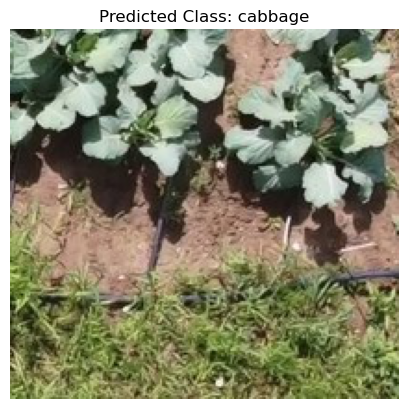

In [39]:
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
import matplotlib.pyplot as plt

transform = transforms.Compose([transforms.Resize((224, 224)),
                                transforms.ToTensor(), 
                                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                     std=[0.229, 0.224, 0.225])])

train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)

classes = train_dataset.classes

# Визуализация предсказаний
sample_image = Image.open('./images_crops/test/cabbage/4.jpg')
sample_image_tensor = transform(sample_image).unsqueeze(0).to(device)

with torch.no_grad():
    model.eval()
    output = model(sample_image_tensor)
    _, predicted_index = torch.max(output.data, 1)
    prob = torch.nn.functional.softmax(output, dim=1)
    
    if prob.max().item() > 0.7:
        predicted_class = classes[predicted_index.item()]
    else:
        predicted_class = 'None'

plt.imshow(sample_image)
plt.axis('off')
plt.title(f'Predicted Class: {predicted_class}')
plt.show()

In [25]:
prob

tensor([[0.0203, 0.9587, 0.0211]], device='cuda:0')

In [26]:
type(model)

torchvision.models.resnet.ResNet

### Try to create window

In [10]:
classes

['beet', 'cabbage', 'corn']

In [43]:
# Script 
from PIL import Image
import torch
import torchvision
from torchvision import transforms, datasets
from torch.nn.functional import softmax
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def crop_predict_image(path_image: str, model: torchvision.models.resnet.ResNet):
    '''
    Функция принимает на вход путь к изображению, разрезает его,
    каждый фрагмент отправляет в модель.
    Выходное значение - список тензоров с вероятноястями.
    '''
        
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        
    image = Image.open(path_image)
    width, height = image.size
    
    transform = transforms.Compose([transforms.Resize((224, 224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                         std=[0.229, 0.224, 0.225])])
    
    train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
    classes = train_dataset.classes
    
    # Список из списков с тензорами вероятностей классов
    predicted_output = [[] for lst in range(0, 19)]
    
    # Настройки для отрисовывания
    colors = ['red', 'blue', 'yellow', 'green', 'orange', 'brown', 'white', 'black']
    
    classes_colors = dict(zip(range(0, 100), zip(classes, colors)))
    
    draw = ImageDraw.Draw(image)
    
    upper = 0
    lower = round(height * 0.1)
    
    row = -1
    
    for h in range(0, 19):
        row += 1
        left = 0
        right = round(width * 0.1)
        
        for w in range(0, 19):
            cropped_image = image.crop((left, upper, right, lower))
            transfromed_image = transform(cropped_image).unsqueeze(0).to(device)
            
            predicted = softmax(model(transfromed_image), -1)
            
            predicted_output[row].append(predicted)
            
            if float(torch.max(predicted)) > 0.95:
                index = int(torch.argmax(predicted))
                
                draw.line((left, upper, right, upper), fill=classes_colors[index][1], width=10)
                draw.line((right, upper, right, lower), fill=classes_colors[index][1], width=10)
                draw.line((left, lower, right, lower), fill=classes_colors[index][1], width=10)
                draw.line((left, lower, left, upper), fill=classes_colors[index][1], width=10)
            
            left += round(width * 0.1)
            right += round(width * 0.1)
            
        upper += round(height * 0.1)
        lower += round(height * 0.1)
    
    text = ''
    for i in classes_colors:
        text = text + classes_colors[i][0] + ' - ' + classes_colors[i][1] + ' \n'
    
    plt.figure(figsize=(16, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.title(text)
    plt.show()
    
    return image, predicted_output, classes

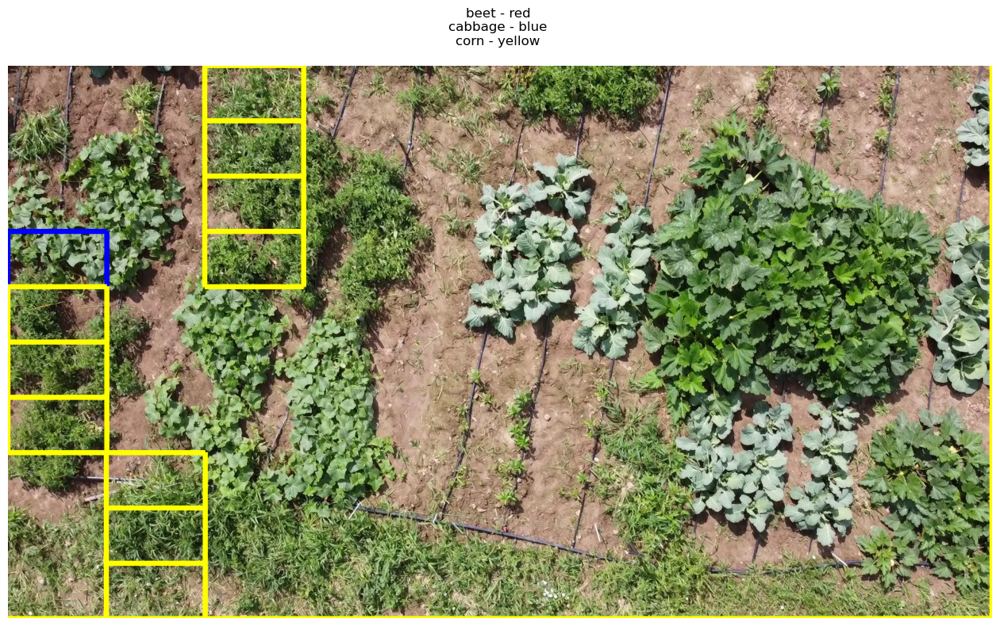

In [44]:
image, predicted_output, classes = crop_predict_image('./test_multiple/frame6059.jpg', model)

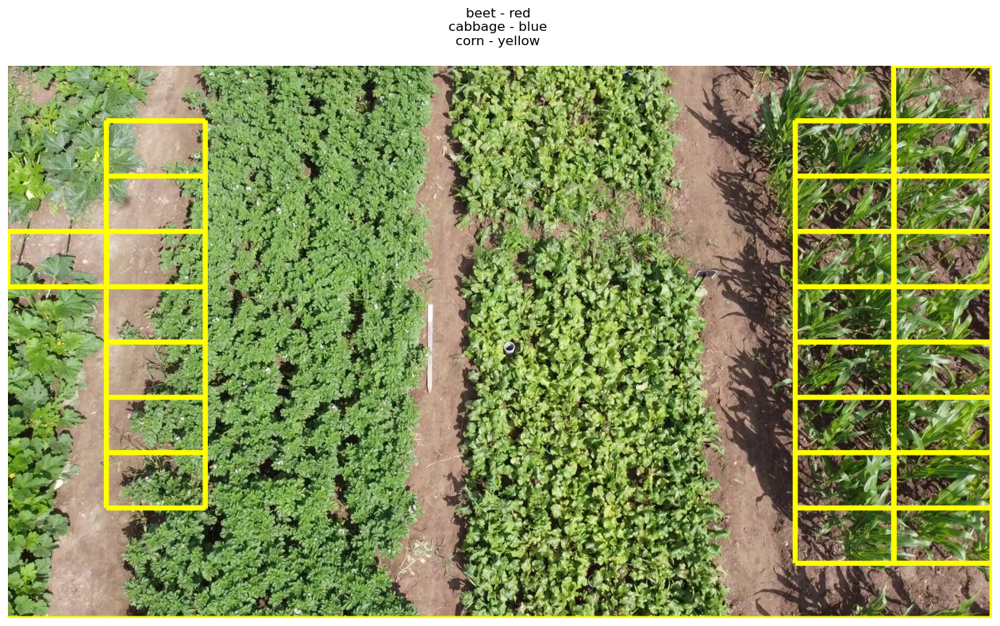

In [45]:
image, predicted_output, classes = crop_predict_image('./test_multiple/frame2300.jpg', model)

### WINDOWS WITH ENSEMBLE

In [15]:
# Script 
from PIL import Image
import torch
import torchvision
from torchvision import transforms, datasets
from torch.nn.functional import softmax
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt

def crop_predict_image_ensemble(path_image: str, path_weights_1: str, path_weights_2: str, path_weights_3: str):
    '''
    Функция принимает на вход путь к изображению, разрезает его,
    каждый фрагмент отправляет в модель.
    Выходное значение - список тензоров с вероятноястями.
    '''
        
    device = torch.device("cpu")
        
    image = Image.open(path_image)
    width, height = image.size
    
    model_sgd = torch.load(path_weights_1, map_location=torch.device('cpu'))
    model_adam = torch.load(path_weights_2, map_location=torch.device('cpu'))
    model_3 = torch.load(path_weights_3, map_location=torch.device('cpu'))

    transform = transforms.Compose([transforms.Resize((224, 224)),
                                    transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                         std=[0.229, 0.224, 0.225])])
    
    train_dataset = datasets.ImageFolder('images_crops/train', transform=transform)
    classes = train_dataset.classes
    
    # Список из списков с тензорами вероятностей классов
    predicted_output = [[] for lst in range(0, 19)]
    
    # Настройки для отрисовывания
    colors = ['red', 'blue', 'yellow', 'green', 'orange', 'brown', 'white', 'black']
    
    classes_colors = dict(zip(range(0, 100), zip(classes, colors)))
    
    draw = ImageDraw.Draw(image)
    
    upper = 0
    lower = round(height * 0.1)
    
    row = -1
    
    for h in range(0, 10):
        row += 1
        left = 0
        right = round(width * 0.1)
        
        for w in range(0, 10):
            cropped_image = image.crop((left, upper, right, lower))
            transfromed_image = transform(cropped_image).unsqueeze(0).to(device)
            
            predicted_sgd = softmax(model_sgd(transfromed_image), -1)
            predicted_adam = softmax(model_adam(transfromed_image), -1)
            predicted_3 = softmax(model_3(transfromed_image), -1)
            
            predicted_output[row].append((predicted_sgd, predicted_adam, predicted_3))
            
            predicted_ensemble = [[sgd, adam, third] for sgd, adam, third in zip(predicted_sgd[0], predicted_adam[0], predicted_3[0])]
            ensemble_output = [(0.7 * value[0].item() + 0.3 * value[2].item())  for value in predicted_ensemble]
            
            if max(ensemble_output) > 0.75:
                index = ensemble_output.index(max(ensemble_output))
                
                draw.line((left, upper, right, upper), fill=classes_colors[index][1], width=10)
                draw.line((right, upper, right, lower), fill=classes_colors[index][1], width=10)
                draw.line((left, lower, right, lower), fill=classes_colors[index][1], width=10)
                draw.line((left, lower, left, upper), fill=classes_colors[index][1], width=10)
            
            left += round(width * 0.1)
            right += round(width * 0.1)
            
        upper += round(height * 0.1)
        lower += round(height * 0.1)
    
    text = ''
    for i in classes_colors:
        text = text + classes_colors[i][0] + ' - ' + classes_colors[i][1] + ' \n'
    
    plt.figure(figsize=(16, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.title(text)
    plt.show()
    
    return image, predicted_output, classes

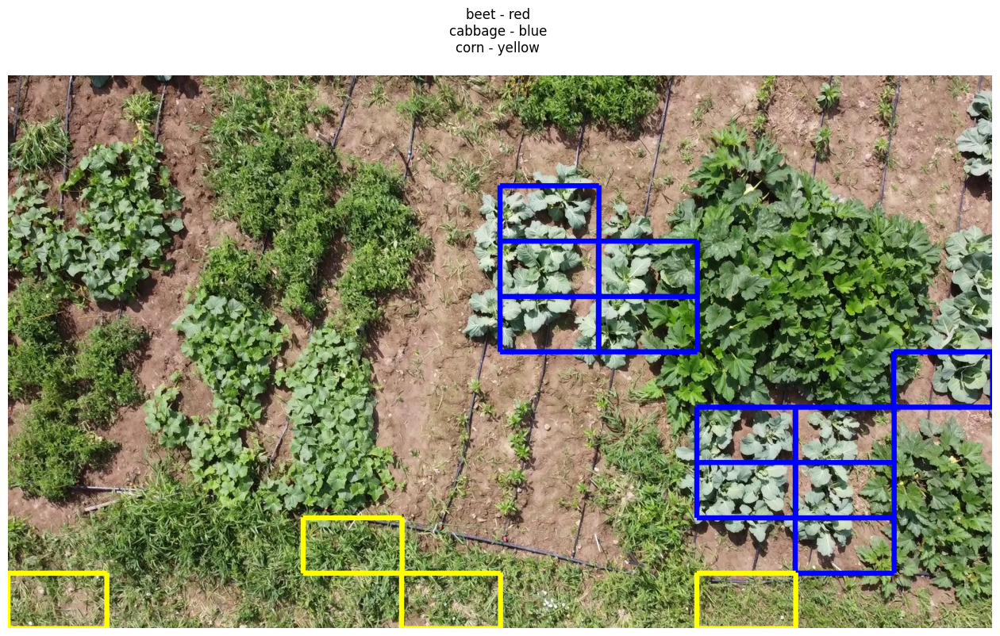

In [16]:
image, predicted_output, classes = crop_predict_image_ensemble('./test_multiple/frame6059.jpg',
                                                               './saved_models/nn_ver9_18.pt',
                                                               './saved_models/nn_ver12_18.pt',
                                                               './saved_models/nn35')

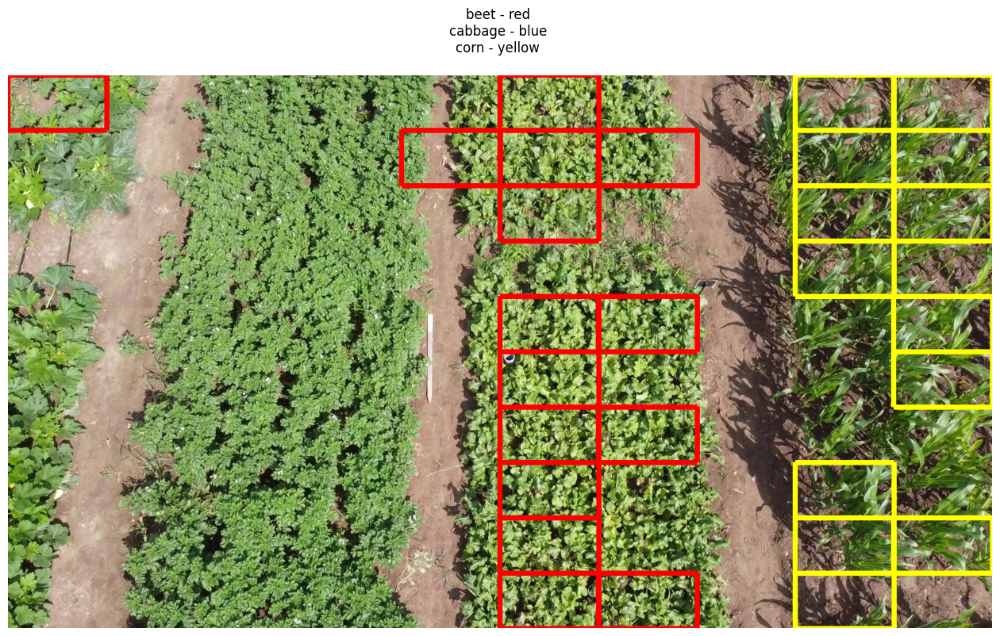

In [17]:
image, predicted_output, classes = crop_predict_image_ensemble('./test_multiple/frame2300.jpg',
                                                               './saved_models/nn_ver9_18.pt',
                                                               './saved_models/nn_ver12_18.pt',
                                                               './saved_models/nn35')